# Рынок заведений общественного питания Москвы

Инвесторы из фонда решили открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

***Цель исследования:***<br>
- Найти интересные особенности рынка общепита в Москве, которые помогут инвесторам с выбором места и заведения.

***Ход исследования:***<br>
Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер и доступна в файле moscow_places.csv. Поэтому о качестве данных ничего не известно.<br>
Следовательно, проверим данные на пропуски, дубликаты и ошибки. И только после этого исследуем данные с помощью визулизаций.<br>
Таким образом, работа будет проходить в следубщие этапы:
1. Загрузка данных и изучение общей информации
2. Предобработка данных
3. Анализ и виззуализация данных
4. Детализация исследования
5. Презентация

#### Описание данных

***Файл moscow_places.csv:***
<ul>
    <li><b>name</b> — название заведения;</li>
    <li><b>address</b> — адрес заведения;</li>
    <li><b>category</b> — категория заведения, например «кафе», «пиццерия» или «кофейня»;</li>
    <li><b>hours</b> — информация о днях и часах работы;</li>
    <li><b>lat</b> — широта географической точки, в которой находится заведение;</li>
    <li><b>lng</b> — долгота географической точки, в которой находится заведение;</li>
    <li><b>rating</b> — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);</li>
    <li><b>price</b> — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;</li>
    <li><b>avg_bill</b> — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        <ul>
            <li>«Средний счёт: 1000–1500 ₽»;</li>
            <li>«Цена чашки капучино: 130–220 ₽»;</li>
            <li>«Цена бокала пива: 400–600 ₽».<br> и так далее;</li>
        </ul>
    </li>
    <li><b>middle_avg_bill</b> — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        <ul>
            <li>Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.</li>
            <li>Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.</li>
            <li>Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.</li>
        </ul>
    </li>
    <li><b>middle_coffee_cup</b> — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        <ul>
            <li>Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.</li>
            <li>Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.</li>
            <li>Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.</li>
        </ul>
    </li>
    <li><b>chain</b> — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        <ul>
            <li>0 — заведение не является сетевым</li>
            <li>1 — заведение является сетевым</li>
        </ul>    
    </li>
    <li><b>district</b> — административный район, в котором находится заведение, например Центральный административный округ;</li>
    <li><b>seats</b> — количество посадочных мест.</li>
</ul>

# Шаг 1. Загружаем данные и изучаем общую информацию

***Загружаем библиотеки***

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
import folium
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from plotly.subplots import make_subplots
import numpy as np
import os
import scipy.stats as st
pd.set_option('max_colwidth', 200)
pd.set_option('display.max_columns', 50)
from pandas.plotting import register_matplotlib_converters
import warnings

***Загружаем датасет***

In [2]:
pth1 = 'datasets/moscow_places.csv'
if os.path.exists(pth1):
    data = pd.read_csv(pth1, sep=',')
else:
    print('Something is wrong')

***Общая информация о датасете***

In [3]:
data.info()
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


В нашем распоряжении 8 406 заведения Москвы.<br>
Названия столбцов соответствует принятым нормам.<br>
Все столбцы имеют тип, соответствующий хранимым данным, кроме одного - seats. <br>
Тип float не подходит для данных с количеством посадочных мест, но так как столбец содержит значения Nan, то к Int привести невозможно.

# Шаг 2. Предобработка данных

***Проверка на дубликаты***

In [4]:
print('Повторяющихся строк в data:', data.duplicated().sum())

Повторяющихся строк в data: 0


***Пропуски***

In [5]:
print('Пропуски встречаются в столбцах:', data.columns[data.isna().any()].tolist())

Пропуски встречаются в столбцах: ['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']


В данных столбцах мы не можем логически обработать пропуски, поэтому оставим как есть.

***Создадим столбец street с названиями улиц***

In [6]:
data['street'] = data['address'].str.split(',').str[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


***Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно***

In [7]:
data['is_24/7'] = data['hours'].str.contains('круглосуточно', case=False, na=False) & data['hours'].str.contains('ежедневно', case=False, na=False) #case не учитывать регистр вхождений, na так как есть пропуски
data['is_24/7'].unique()

array([False,  True])

***Проверка на неявные дубликаты***

In [8]:
print('Повторяющихся названий заведений на одной и той же улице:', data.duplicated(subset=['name', 'street', 'category']).sum())

Повторяющихся названий заведений на одной и той же улице: 132


Удалим эти повторения

In [9]:
data = data.drop_duplicates(subset=['name', 'street', 'category'])
data = data.reset_index()
data.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


# Шаг 3. Анализ данных

## Исследование категорий заведений

***Посчитаем количество заведений в разрезе категорий***

In [10]:
data_cat = data.groupby('category').agg({'name': 'count'}).sort_values(by='name',ascending=False)
data_cat = data_cat.reset_index()

***Построим график***

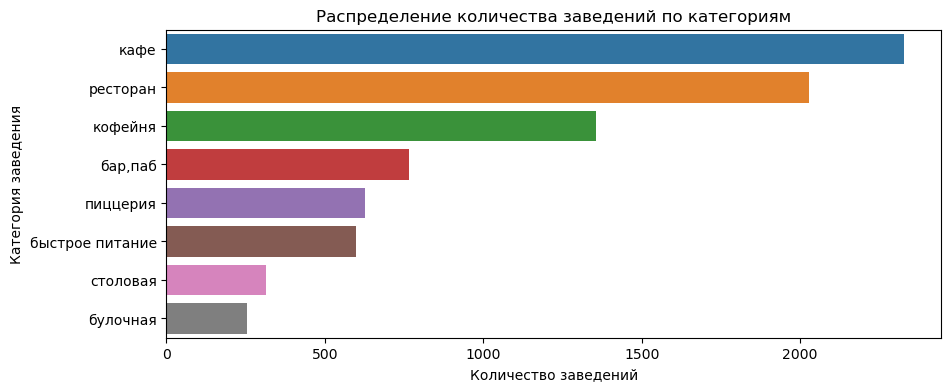

In [11]:
plt.figure(figsize=(10, 4))
ax = sns.barplot(x='name', y='category', data=data_cat)
plt.title('Распределение количества заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')
None

Больше всего заведений в категориях кафе и ресторан, менее распространены булочная и столовая.

## Исследование количества посадочных мест в местах по категориям

***Посичтаем медиану количества посадочных мест по категориям***

In [12]:
data_seats = data.groupby('category').agg({'seats': 'median'}).sort_values(by='seats',ascending=False)
data_seats = data_seats.reset_index()

***Посторим график***

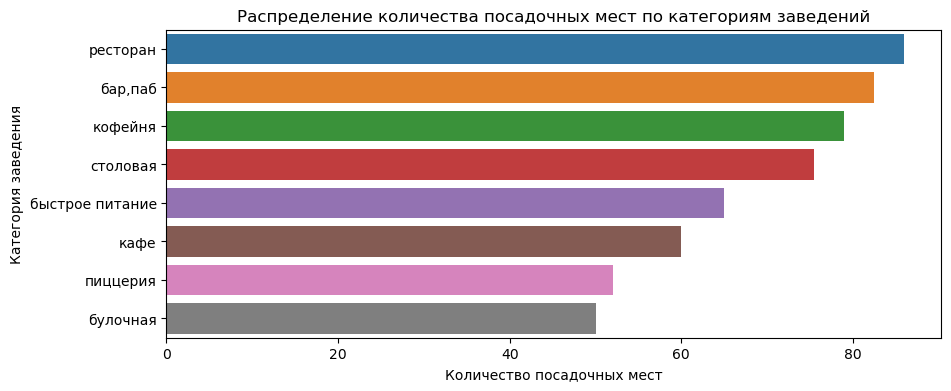

In [13]:
plt.figure(figsize=(10, 4))
ax = sns.barplot(x='seats', y='category', data=data_seats)
plt.title('Распределение количества посадочных мест по категориям заведений')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
None

Как и ожидалось, самые вместительные это рестораны. Но вот кофейни на третьем месте неожиданно обогнали даже столовые. 

## Исследование соотношения сетевых и несетевых заведений

***Посчитаем количество сетевых и несетвых заведений***

In [14]:
data_chain = data.groupby('chain').agg({'name': 'count'}).sort_values(by='name',ascending=False)
data_chain = data_chain.reset_index()
data_chain

,chain,name
0,0,5165
1,1,3109


Заменим значение 0 на 'Не сетевое', а значение 1 на 'Сетевое'

In [15]:
data_chain.loc[data_chain['chain'] == 0, 'chain'] = 'Не сетевое'
data_chain.loc[data_chain['chain'] == 1, 'chain'] = 'Сетевое'
data_chain

,chain,name
0,Не сетевое,5165
1,Сетевое,3109


***Построим график***

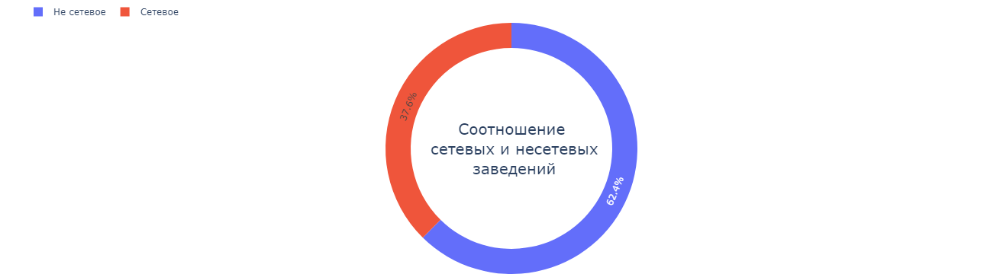

In [16]:
fig = go.Figure(data=[go.Pie(labels=data_chain['chain'], values=data_chain['name'], hole=0.8)])

fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.0,
        xanchor="left",
        x=0),
    title_x = 0.5,
    margin=dict(l=30, r=0, t=30, b=0),
    annotations=[dict(text='Соотношение<br> сетевых и несетевых<br> заведений', x=0.5, y=0.5, font_size=20, showarrow=False)])


fig.show() 

Из графика выше видим, что несетевых заведений в Москве больше. 

## Категории заведений, которые чаще являются сетевыми.

***Возьмем сетевые заведения и сгруппируем по категориям***

In [17]:
data_chain_1 = data[data['chain'] == 1].groupby('category').agg({'name': 'count'}).sort_values(by='name',ascending=False).reset_index()
data_chain_all = data.groupby('category').agg({'name': 'count'}).sort_values(by='name',ascending=False).reset_index()
data_chain_1.columns = ['category', 'cnt_chain']
data_chain_all.columns = ['category', 'cnt_all']
data_chain_agg = data_chain_1.merge(data_chain_all[['category', 'cnt_all']], how='left', on='category')
data_chain_agg['part_chain'] = round((data_chain_agg['cnt_chain'] / data_chain_agg['cnt_all'] *100), 2)
data_chain_agg['part_not_chain'] = round(100 - data_chain_agg['part_chain'], 2)
data_chain_agg = data_chain_agg.sort_values('part_chain', ascending=False)
data_chain_agg

,category,cnt_chain,cnt_all,part_chain,part_not_chain
6,булочная,155,254,61.02,38.98
3,пиццерия,324,627,51.67,48.33
2,кофейня,664,1357,48.93,51.07
4,быстрое питание,230,598,38.46,61.54
1,ресторан,718,2029,35.39,64.61
0,кафе,761,2329,32.67,67.33
7,столовая,88,315,27.94,72.06
5,"бар,паб",169,765,22.09,77.91


***Пострим график***

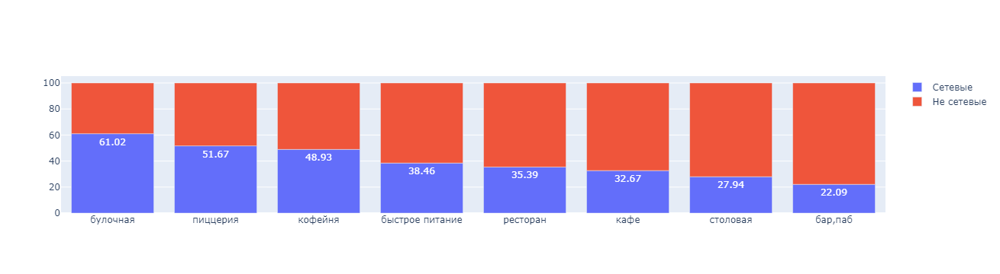

In [18]:
fig = go.Figure()
fig.add_bar(x=data_chain_agg['category'], y=data_chain_agg['part_chain'], name='Сетевые', text=data_chain_agg['part_chain'])
fig.add_bar(x=data_chain_agg['category'], y=data_chain_agg['part_not_chain'], name='Не сетевые')
fig.update_layout(barmode="relative")
fig.show()
None

Сетевые чаще всего это кафе, рестораны и кофейни.

## Изучим самые многочисленные сетевые заведения

In [19]:
data_chain_top = data[data['chain']==1].groupby(['name', 'category'])['name'].agg({'count'}).sort_values(by='count', ascending=False)
data_chain_top = data_chain_top.reset_index().head(15)
data_chain_top

,name,category,count
0,Шоколадница,кофейня,94
1,Домино'с Пицца,пиццерия,74
2,Додо Пицца,пиццерия,72
3,Яндекс Лавка,ресторан,66
4,One Price Coffee,кофейня,59
5,Cofix,кофейня,58
6,Prime,ресторан,45
7,Кулинарная лавка братьев Караваевых,кафе,38
8,КОФЕПОРТ,кофейня,37
9,Теремок,ресторан,32


***Построим график***

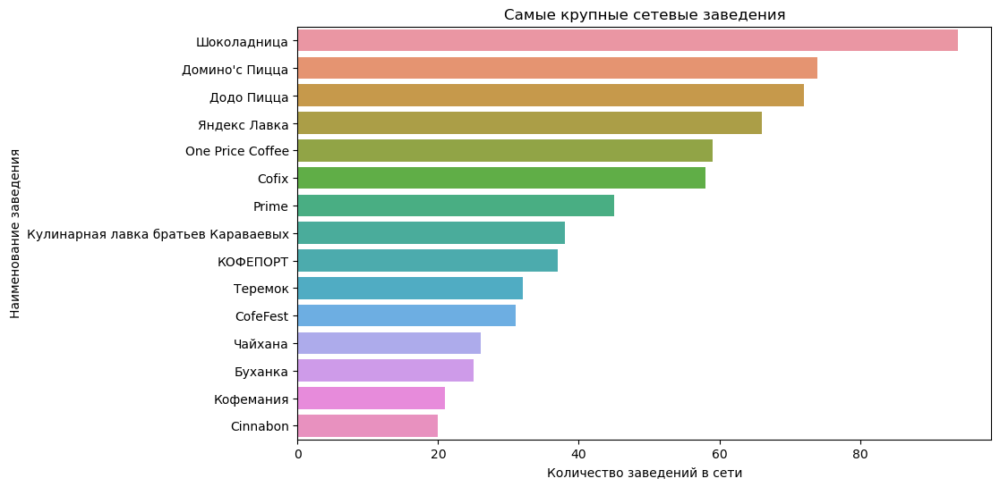

In [20]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='count', y='name', data=data_chain_top)
plt.title('Самые крупные сетевые заведения')
plt.xlabel('Количество заведений в сети')
plt.ylabel('Наименование заведения')
None

В безусловных лидерах находится кофейня Шоколадница. Второе и третье место делят пиццерии.

## Анализ завдений по районам

***Соберем информацию по заведениям в разрезе райнов Москвы***

In [21]:
data_district = data.groupby(['district', 'category'])['name'].agg({'count'}).sort_values(by='count', ascending=False)
data_district = data_district.reset_index()
data_district['district'] = data_district['district'].map(lambda x : str(x)[:-23])

data_district

,district,category,count
0,Центральный,ресторан,666
1,Центральный,кафе,461
2,Центральный,кофейня,418
3,Центральный,"бар,паб",364
4,Юго-Восточный,кафе,271
...,...,...,...
67,Северо-Западный,"бар,паб",23
68,Северо-Западный,столовая,18
69,Юго-Западный,столовая,17
70,Юго-Восточный,булочная,13


***Пострим график***

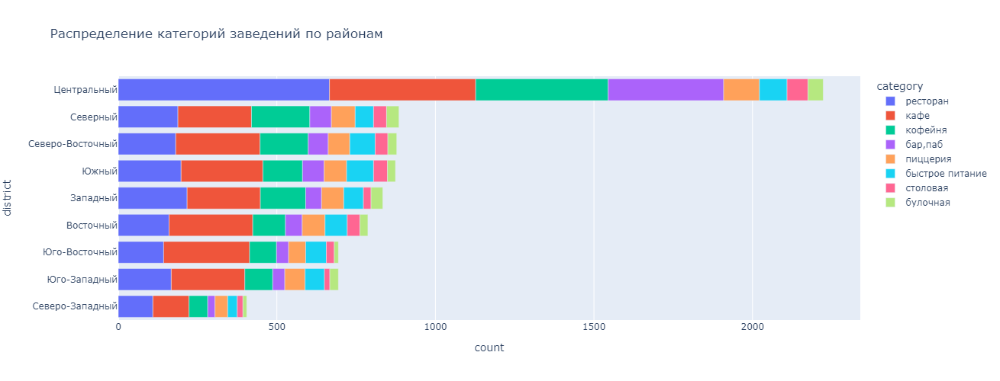

In [22]:
fig = px.bar(data_district, x="count", y="district", color="category", title="Распределение категорий заведений по районам", height=500)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Во всех окгругах кроме центрального, на первом месте кафе, а вот в центральном на первом месте рестораны.

## Анализ средних рейтингов по категориям заведений

In [23]:
data_rating = data.groupby(['category', 'rating'])['name'].agg({'count'}).sort_values(by='rating', ascending=False).reset_index()
data_rating.head(10)

,category,rating,count
0,столовая,5.0,2
1,кафе,5.0,30
2,булочная,5.0,1
3,"бар,паб",5.0,7
4,быстрое питание,5.0,6
5,ресторан,5.0,15
6,кофейня,5.0,37
7,пиццерия,5.0,7
8,"бар,паб",4.9,27
9,кофейня,4.9,37


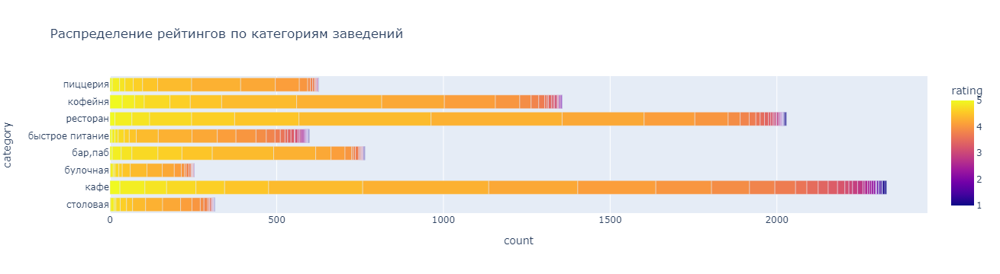

In [24]:
fig = px.bar(data_rating, x="count", y="category", color='rating', title="Распределение рейтингов по категориям заведений")
fig.show()

Как мы видим на графике, больше всего оценивают кафе, рестораны и кофейни. Большинство средних рейтингов располагаются от 4 до 4,7

## Построим фоновую картограмму со средним рейтингом заведений каждого района

In [25]:
data_rating = data.groupby('district')['rating'].agg('median').reset_index()
data_rating

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [26]:
# загружаем JSON-файл с границами округов Москвы
with open('datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    state_geo = json.load(f)


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам'
).add_to(m)

# выводим карту
m


Все лучшие заведения ну конечно же в центре.

## Отобразим все заведения на карте

In [27]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

## Найдем Топ-15 улиц по количеству заведений

***Найдем топ улиц по общему количеству заведений***

In [28]:
top_street = pd.pivot_table(data, index=['street'],
                              values=["name"],
                              aggfunc=[len]
                              ).sort_values(('len', 'name'), ascending=False).reset_index().head(15)
top_street

,street,len
,,name
0,проспект Мира,169
1,Профсоюзная улица,115
2,проспект Вернадского,104
3,Ленинский проспект,104
4,Ленинградский проспект,93
5,Дмитровское шоссе,85
6,Варшавское шоссе,74
7,Каширское шоссе,72
8,Ленинградское шоссе,67


***Схохраним топ улиц в список***

In [29]:
top_street_list = top_street['street'].tolist()
top_street_list

[' проспект Мира',
 ' Профсоюзная улица',
 ' проспект Вернадского',
 ' Ленинский проспект',
 ' Ленинградский проспект',
 ' Дмитровское шоссе',
 ' Варшавское шоссе',
 ' Каширское шоссе',
 ' Ленинградское шоссе',
 ' Люблинская улица',
 ' улица Вавилова',
 ' Кутузовский проспект',
 ' МКАД',
 ' улица Миклухо-Маклая',
 ' Пятницкая улица']

***Сделаем срез в общем датасете по топу улиц***

In [30]:
data_street_top = data.query('street in @top_street_list')
data_street_top.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
12,12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,МКАД,False
17,17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
26,26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00–22:00",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False
28,28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False


***Сгруппируем по категориям и названиям улиц***

In [31]:
data_street_top_group = data_street_top.groupby(['street', 'category'])['name'].agg({'count'}).sort_values(by='count', ascending=False).reset_index()
data_street_top_group

,street,category,count
0,проспект Мира,кафе,50
1,проспект Мира,ресторан,45
2,Ленинский проспект,ресторан,33
3,проспект Вернадского,ресторан,32
4,Профсоюзная улица,кафе,32
...,...,...,...
106,Кутузовский проспект,булочная,1
107,проспект Вернадского,булочная,1
108,Люблинская улица,пиццерия,1
109,МКАД,столовая,1


***Построим график***

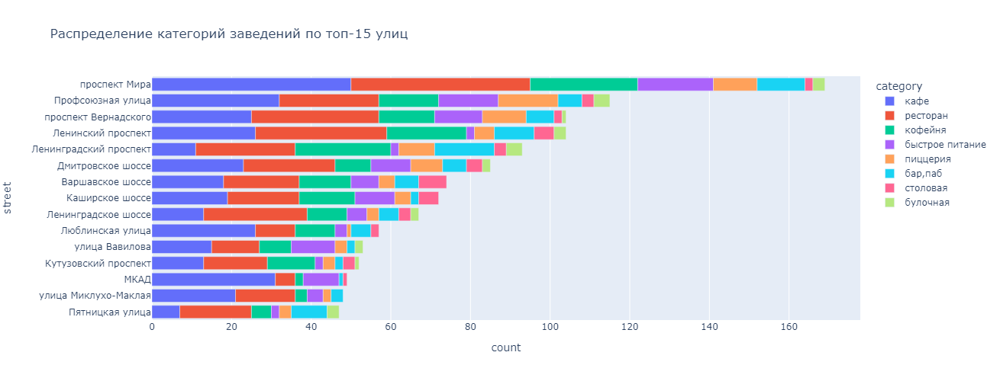

In [32]:
fig = px.bar(data_street_top_group, x="count", y="street", color="category", title="Распределение категорий заведений по топ-15 улиц", height=500)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Проспект Мира самая богатая на заведения улица. На Ленинградском проспекте чаще встречаются рестораны и кофейни. А на МКАДе преобладают кафе...

## Найдем улицы, на которых находится только один объект общепита.

In [33]:
street_one_cnt = data.groupby(['street'])['name'].agg({'count'}).reset_index()
street_one_cnt = street_one_cnt.query('count == 1')

street_one_cnt_list = street_one_cnt['street'].tolist()

In [34]:
data_one_cnt = data.query('street in @street_one_cnt_list')
data_one_cnt.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False


***Посмотрим на категории этих заведений***

In [35]:
data_one_cnt_group_cat = data_one_cnt.groupby(['district','category'])['name'].agg({'count'}).sort_values(by='count', ascending=False).reset_index()
data_one_cnt_group_cat.head(15)

,district,category,count
0,Центральный административный округ,кафе,38
1,Центральный административный округ,ресторан,36
2,Центральный административный округ,кофейня,34
3,Центральный административный округ,"бар,паб",23
4,Южный административный округ,кафе,22
5,Северный административный округ,кафе,21
6,Юго-Восточный административный округ,кафе,20
7,Восточный административный округ,кафе,19
8,Северо-Восточный административный округ,кафе,16
9,Северо-Восточный административный округ,ресторан,14


***Посмотрим на график***

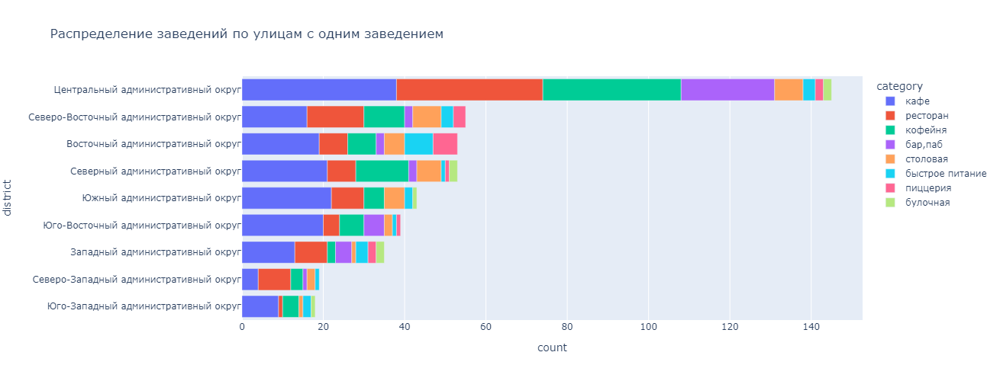

In [36]:
fig = px.bar(data_one_cnt_group_cat, x="count", y="district", color="category", title="Распределение заведений по улицам с одним заведением", height=500)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Больше всего таких улиц в ЦАО и в них кофейни рестораны и кафе распределились почти поровну. Судя по всему можно рассмотрерть открытие альтернативного заведения на этих улицах.

## Анализ среднего чека по районам

***Агрегируем данные***

In [37]:
data_avg_bill = data.groupby('district')['middle_avg_bill'].agg('median').reset_index()
data_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


***Перенесем данные на карту***

In [38]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам'
).add_to(m)

m

Как и предполагалось, самый высокий чек в центральном окгруге.<br> Но вот что было не очевидным, так это высокий средний чек на уровне ЦАО наблюдается в Западном округе.<br> Может так влияют Внуково, Сколково и Рублевка...

## Общий вывод

Итак, проведенный графический анализ выше, показывает нам следующие фапкты:
 - Больше всего заведений в категориях кафе и ресторан, менее распространены булочная и столовая.
 - По кол-ву посадочных мест, как и ожидалось, самые вместительные это рестораны. Но вот кофейни на третьем месте неожиданно обогнали даже столовые.
 - Соотношение сетевых и несетевых заведений следующее: Не сетевое – 5165 (62,4%) Сетевое – 3109 (37,6%)
 - Сетевые заведения чаще всего это кафе, рестораны и кофейни.
 - По количеству заведений В безусловных лидерах находится сетевая кофейня Шоколадница. Второе и третье место делят пиццерии.
 - Распределение категорий заведений по административным округам: во всех округах кроме центрального, на первом месте кафе, а вот в центральном на первом месте рестораны.
 - Категории по рейтингам (оценкам): как мы видим на графике, больше всего оценивают кафе, рестораны и кофейни. Большинство средних рейтингов располагаются от 4 до 4,7
 - Все лучшие заведения конечно же в центре.
 - Проспект Мира самая богатая на заведения улица. На Ленинградском проспекте чаще встречаются рестораны и кофейни. А на МКАДе преобладают кафе...
 - Больше всего улиц с одним заведением в ЦАО и в них кофейни рестораны и кафе распределились почти поровну. Судя по всему можно рассмотрерть открытие альтернативного заведения на этих улицах.
 - По среднему чеку: Как и предполагалось, самый высокий чек в центральном окгруге. Но вот что было не очевидным, так это высокий средний чек на уровне ЦАО наблюдается в Западном округе. Может так влияют Внуково, Сколково и Рублевка...


# Шаг 4. Детализируем исследование: открытие кофейни

Заказчик решил открыть кофейню в Москве. Будем считать, что он не боится конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно.<br> 
Попробуем определить, осуществима ли мечта заказчика.<br> <br> 
Ответим на следующие вопросы:
 - Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
 - Есть ли круглосуточные кофейни?
 - Какие у кофеен рейтинги? Как они распределяются по районам?
 - На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

## Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [39]:
data_coffee = data.query('category == "кофейня"')
print('В датасете', len(data_coffee), 'заведений в категории "кофейня"')

В датасете 1357 заведений в категории "кофейня"


In [40]:
data_coffee_dist = data_coffee.groupby('district')['name'].agg({'count'}).sort_values('count', ascending=False).reset_index()
data_coffee_dist

,district,count
0,Центральный административный округ,418
1,Северный административный округ,184
2,Северо-Восточный административный округ,152
3,Западный административный округ,143
4,Южный административный округ,125
5,Восточный административный округ,103
6,Юго-Западный административный округ,88
7,Юго-Восточный административный округ,85
8,Северо-Западный административный округ,59


***Построим график***

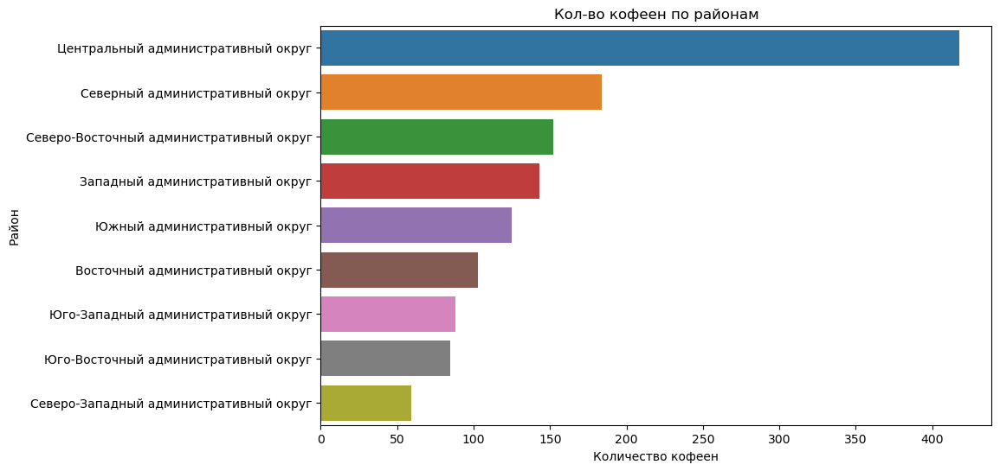

In [41]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='count', y='district', data=data_coffee_dist)
plt.title('Кол-во кофеен по районам')
plt.xlabel('Количество кофеен')
plt.ylabel('Район')
None

Больше всего кофеен конечно же в центре. Также на севере собрались любители кофе.

## Есть ли круглосуточные кофейни?

In [42]:
data_coffee_24_7 = data_coffee[data_coffee['is_24/7'] == True]
print('В датасете', len(data_coffee_24_7), 'круглосуточно работающих кофеен и', len(data_coffee_24_7[data_coffee_24_7['chain'] == 1]), 'из них сетевые.')

В датасете 54 круглосуточно работающих кофеен и 45 из них сетевые.


На всю столицу всего 9 несетевых кофеен с круглосуточным режимом работы.

## Какие у кофеен рейтинги? Как они распределяются по районам?

In [43]:
data_coffee_rating = data_coffee.groupby(['district', 'rating'])['name'].agg('count').reset_index()
data_coffee_rating['district'] = data_coffee_rating['district'].map(lambda x : str(x)[:-23])
data_coffee_rating

,district,rating,name
0,Восточный,3.0,1
1,Восточный,3.1,1
2,Восточный,3.3,1
3,Восточный,3.4,1
4,Восточный,3.6,2
...,...,...,...
162,Южный,4.6,3
163,Южный,4.7,7
164,Южный,4.8,2
165,Южный,4.9,3


***Построим график***

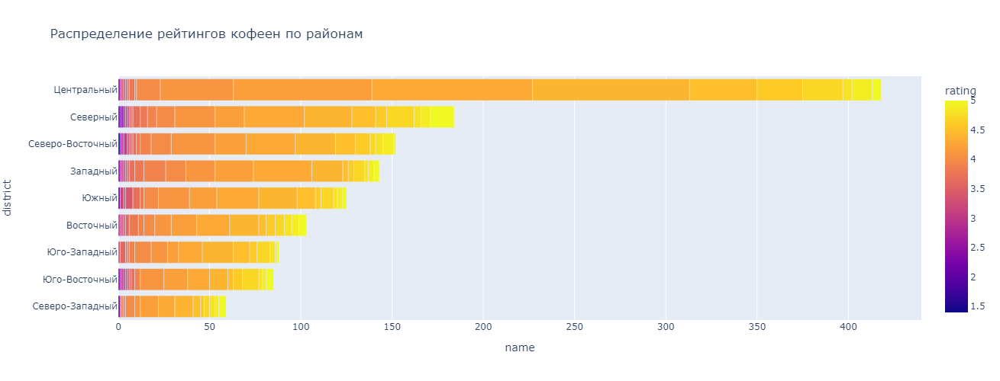

In [44]:
fig = px.bar(data_coffee_rating, x="name", y="district", color="rating", title="Распределение рейтингов кофеен по районам", height=500)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Больше всего кофейни оценивают в центре. Но что удивительно, максимальное количество максимальных средних рейтингов находятся в Северном районе. Неужели здесь самые лучшие кофейни?

## На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [45]:
data_coffee
data_middle_coffee_cup = data_coffee.groupby('district')['middle_coffee_cup'].agg({'median'}).sort_values('median', ascending=False).reset_index()
data_middle_coffee_cup

,district,median
0,Юго-Западный административный округ,197.0
1,Центральный административный округ,187.5
2,Западный административный округ,177.5
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,160.0
5,Северный административный округ,155.0
6,Южный административный округ,149.5
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


***Расчитаем среднюю цену чашки кофе по Москве***

In [46]:
print('Средняя цена чашки кофе по Москве составляет', round(data_middle_coffee_cup['median'].mean()), 'рубля.')

Средняя цена чашки кофе по Москве составляет 164 рубля.


***Построим график***

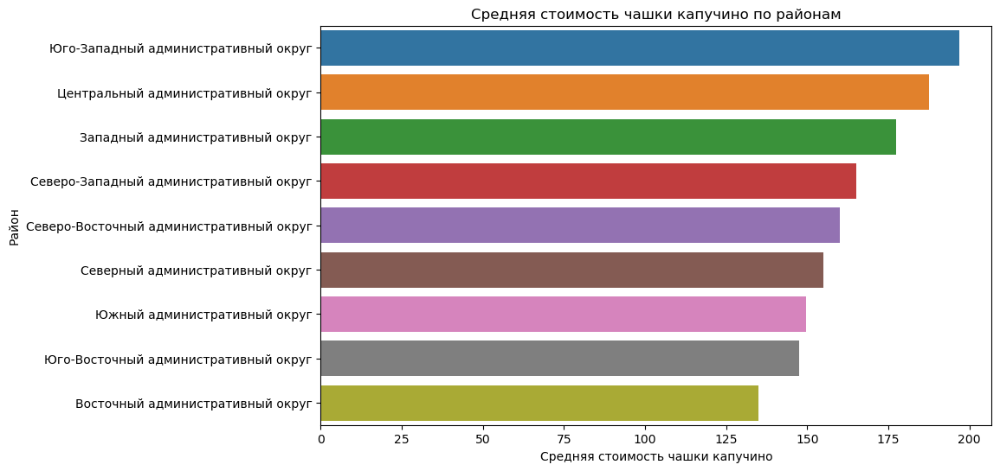

In [47]:
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='median', y='district', data=data_middle_coffee_cup)
plt.title('Средняя стоимость чашки капучино по районам')
plt.xlabel('Средняя стоимость чашки капучино')
plt.ylabel('Район')
None

Вот на такие средние (медианные) цены за чашку капучино стоит расчитывать при открытии кофейни в указанных районах. Как ни странно, самая дорогая средняя чашка капучино в  Юго-Западном административном округе.

## Рекомендации по открытию кофейни

 - В центре слишком много разнообразных кофеен, хотя там явно не хватает 5-тибальных кофеен. Или там просто посетители более требовательны.
 - В Северном округе будет большая конкуренция 5-тибальных, при достаточно низкой средней стоимости чашки кофе.
 - Стоит присмотреться к Западному и Юго-западному райнам, так как количество кофеен здесь не так много, а средняя цена чашки кофе достаточно высока, да и стоимость аренды помещения будет значительно дешевле, чем в центре.